# Hierarchical - Travel Review

### Import libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#set default setting of seaborn
sns.set()


### Read dataset

In [2]:

#read the data
Data = pd.read_csv("google_review_ratings.csv")

# print the first 5 rows
Data.head()


,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


In [3]:
Data.shape

(5456, 26)

### Understand and Prepare data

In [4]:
#using drop() function to remove redundant feature
DF = Data.drop(['Unnamed: 25'], axis=1)
DF.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


In [5]:
#Renaming columns
column_names = ['user_id', 'churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']

DF.columns = column_names
DF.head()

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


In [6]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theatres               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs_bars              5456 non-null   float64
 11  local_services         5456 non-null   object 
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5456 non-null   float64
 14  juice_bars             5456 non-null   float64
 15  art_

In [7]:
DF['local_services'].unique()  #getting all unique values

array(['1.7', '1.73', '1.71', '1.69', '1.67', '1.65', '1.66', '1.64',
       '1.63', '5', '1.56', '1.55', '1.53', '1.52', '1.51', '1.5', '1.49',
       '1.48', '1.46', '2.13', '2.12', '2.1', '2.09', '2.08', '2.07',
       '2.06', '2.05', '2.04', '2.03', '2.01', '2', '1.98', '1.97',
       '1.95', '1.93', '1.91', '1.9', '1.88', '1.86', '1.84', '1.83',
       '1.81', '1.79', '1.77', '1.74', '1.72', '1.68', '1.61', '1.6',
       '1.59', '1.58', '1.99', '2.47', '2.35', '2.48', '2.59', '3.39',
       '2.31', '2.78', '2.79', '2.77', '2.76', '2.75', '2.74', '2.72',
       '2.71', '2.69', '2.68', '2.66', '2.65', '2.63', '2.61', '2.57',
       '2.55', '2.53', '2.51', '2.49', '1.94', '1.92', '1.82', '1.76',
       '1.62', '4.08', '4.04', '4.02', '4.01', '4', '3.99', '3.98',
       '3.96', '3.95', '3.94', '3.93', '3.91', '3.9', '3.88', '3.87',
       '3.86', '3.84', '3.85', '2.17', '3', '2.99', '2.82', '2.83',
       '2.81', '2.8', '2.73', '2.67', '2.64', '2.62', '2.54', '2.52',
       '2.5', '2.

In [8]:
#get row number where local services in invalid
DF[DF['local_services'] == '2\t2.']['local_services']
DF = DF.drop(DF[DF['local_services'] == '2\t2.'].index)
DF[['local_services']] = DF[['local_services']].apply(pd.to_numeric)

DF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5455 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5455 non-null   object 
 1   churches               5455 non-null   float64
 2   resorts                5455 non-null   float64
 3   beaches                5455 non-null   float64
 4   parks                  5455 non-null   float64
 5   theatres               5455 non-null   float64
 6   museums                5455 non-null   float64
 7   malls                  5455 non-null   float64
 8   zoo                    5455 non-null   float64
 9   restaurants            5455 non-null   float64
 10  pubs_bars              5455 non-null   float64
 11  local_services         5455 non-null   float64
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5455 non-null   float64
 14  juice_bars             5455 non-null   float64
 15  art_

In [9]:
DF_Copy = DF.copy(deep=True)  #creating a copy of a dataframe

In [10]:
#data frame with numerical features
DF_Copy.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,...,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5454.000000
mean,1.455674,2.319824,2.489520,2.797192,2.959278,2.893809,3.351778,2.541047,3.126301,2.833093,...,2.206060,1.192821,0.949175,0.822374,0.969072,0.999443,0.965098,1.749941,1.530818,1.560570
std,0.827673,1.421542,1.247852,1.309084,1.338948,1.282301,1.413338,1.111338,1.356767,1.307509,...,1.715701,1.107105,0.973623,0.947993,1.202844,1.193097,0.928332,1.598275,1.316172,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.685000,2.740000,4.095000,4.315000,3.840000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [11]:
#data frame with categirical features
DF.describe(include='object')

,user_id
count,5455
unique,5455
top,User 137
freq,1


In [12]:
#get the count of missing values
missing_values = DF_Copy.isnull().sum()

#print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  1
dtype: int64


In [13]:
DF_no_missing = DF_Copy.fillna(DF_Copy.mean())

In [14]:
#Rechecking missing values
missing_values = DF_no_missing.isnull().sum()

#print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  0
dtype: int64


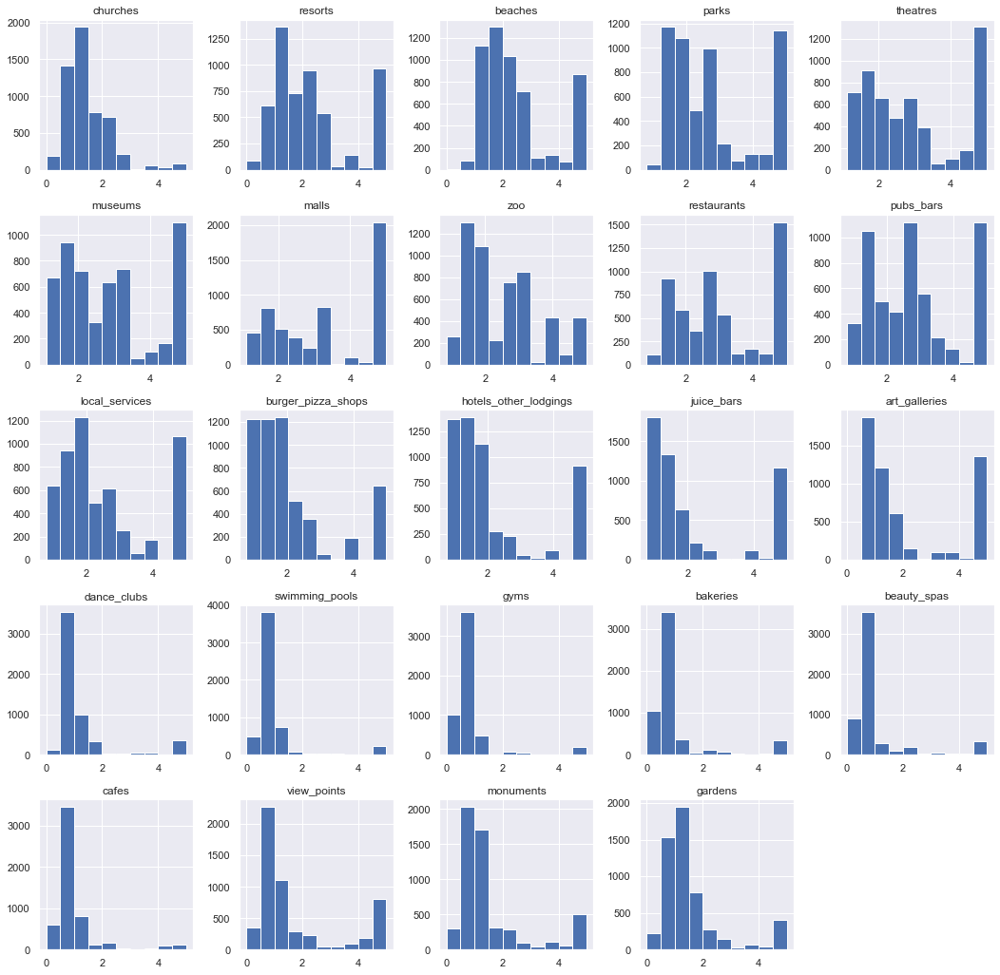

In [15]:
#PDFs of features
fig = DF_no_missing.hist(figsize=(18, 18))

In [16]:
#check if users have rated all features
data_description = DF_no_missing.describe()
rated = data_description.loc['min'] > 0
rated[rated]

parks                    True
theatres                 True
museums                  True
malls                    True
zoo                      True
restaurants              True
pubs_bars                True
local_services           True
burger_pizza_shops       True
hotels_other_lodgings    True
juice_bars               True
Name: min, dtype: bool

In [17]:
#creating the dataframe containing number of review for each feature
reviews =DF_no_missing[column_names[1:]].astype(bool).sum(axis=0).sort_values()
reviews

bakeries                 4409
gyms                     4438
beauty_spas              4559
cafes                    4851
swimming_pools           4976
view_points              5110
monuments                5153
gardens                  5230
churches                 5260
dance_clubs              5343
resorts                  5365
art_galleries            5451
beaches                  5451
pubs_bars                5455
local_services           5455
zoo                      5455
hotels_other_lodgings    5455
juice_bars               5455
malls                    5455
museums                  5455
theatres                 5455
parks                    5455
restaurants              5455
burger_pizza_shops       5455
dtype: int64

In [18]:
column_names = DF_no_missing.columns.values

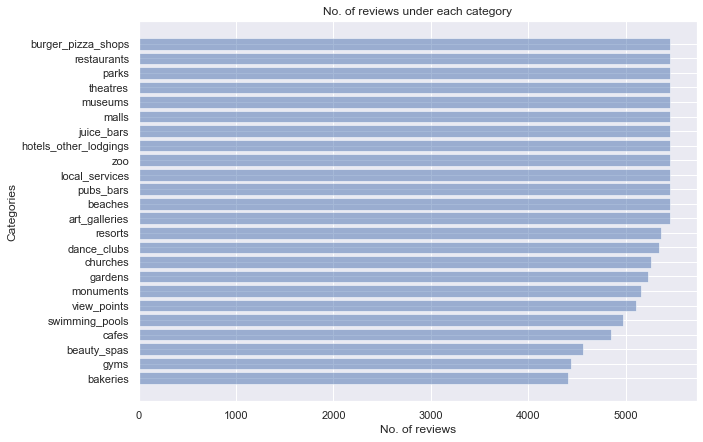

In [19]:
plt.figure(figsize=(10, 7))
plt.barh(np.arange(len(column_names[1:])), reviews.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), reviews.index)
plt.xlabel('No. of reviews')
plt.ylabel('Categories')
plt.title('No. of reviews under each category')
plt.show()

In [20]:
#creating a dataframe to store no. of reviews by users
no_of_reviews = DF_no_missing[column_names[1:]].astype(bool).sum(axis=1).value_counts()
no_of_reviews

24    3724
23     505
21     457
20     243
22     167
19     148
18     114
17      69
16      22
15       6
dtype: int64

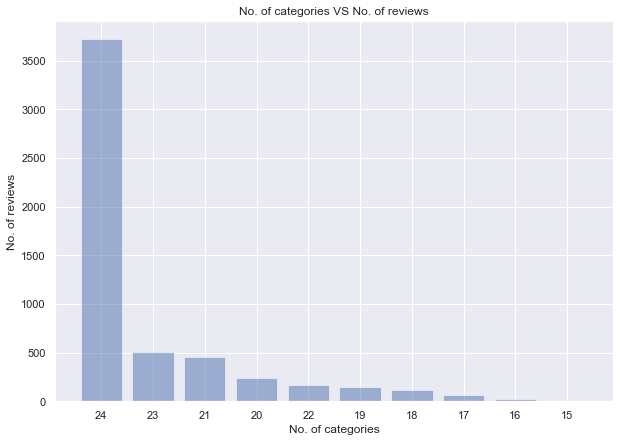

In [21]:
#plotting the no. of customers Vs no. of reviews
plt.figure(figsize=(10, 7))
plt.bar(np.arange(len(no_of_reviews)), no_of_reviews.values, align='center', alpha=0.5)
plt.xticks(np.arange(len(no_of_reviews)), no_of_reviews.index)
plt.xlabel('No. of categories')
plt.ylabel('No. of reviews')
plt.title('No. of categories VS No. of reviews')
plt.show()

C:\Users\yashw\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


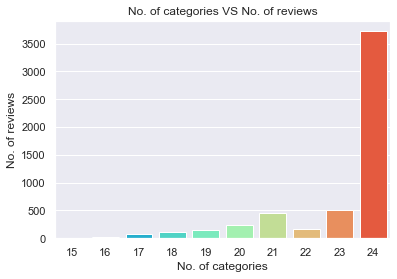

In [22]:
sns.countplot(DF_no_missing[column_names[1:]].astype(bool).sum(axis=1), palette="rainbow")
plt.xlabel('No. of categories')
plt.ylabel('No. of reviews')
plt.title('No. of categories VS No. of reviews')
plt.show()

In [23]:
#creating a dataframe to store average rating for each feature
avg_rating = DF_no_missing[column_names[1:]].mean()  #average rating is calculated by dividing count by total number of observations
avg_rating = avg_rating.sort_values()  #sorting the rating in increasing order
avg_rating

gyms                     0.822374
swimming_pools           0.949175
cafes                    0.965098
bakeries                 0.969072
beauty_spas              0.999443
dance_clubs              1.192821
churches                 1.455674
monuments                1.530818
gardens                  1.560570
view_points              1.749941
burger_pizza_shops       2.078339
hotels_other_lodgings    2.125747
juice_bars               2.190346
art_galleries            2.206060
resorts                  2.319824
beaches                  2.489520
zoo                      2.541047
local_services           2.550071
parks                    2.797192
pubs_bars                2.833093
museums                  2.893809
theatres                 2.959278
restaurants              3.126301
malls                    3.351778
dtype: float64

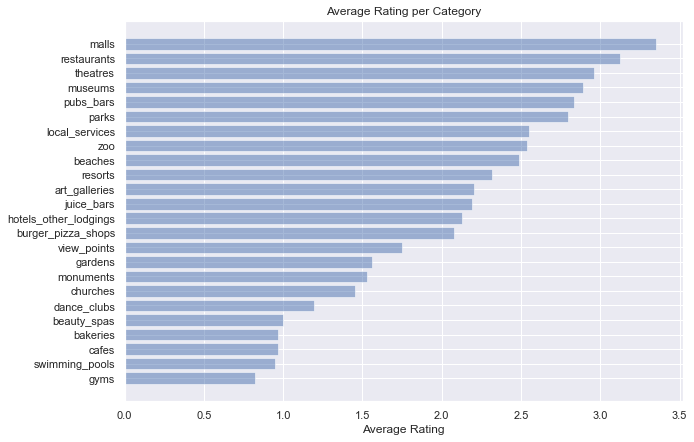

In [24]:
#plotting average rating plots
plt.figure(figsize=(10, 7))
plt.barh(np.arange(len(column_names[1:])), avg_rating.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), avg_rating.index)
plt.xlabel('Average Rating')
plt.title('Average Rating per Category')
plt.show()

In [25]:
data_1 = DF_no_missing.copy()
new = data_1['user_id'].str.split(' ', n=2, expand=True)
data_1['user'] = new[0]
data_1['id'] = new[1]
data_1 = data_1.drop(['user_id', 'user'], axis=1)
data_1.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


In [26]:
data_final = data_1.copy(deep=True)
data_final.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


In [27]:
data_final.shape

(5455, 25)

In [28]:
features = data_final.drop(["id"], axis=1)
features.shape

(5455, 24)

In [29]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
features= scaler.fit_transform(features)
features_scaled = pd.DataFrame(features, columns=data_final.columns[0:24])
features_scaled.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,-1.758915,-1.632057,0.914039,0.651514,1.524264,0.020427,1.166298,-0.171923,-0.586964,-0.147693,...,-0.271669,-0.544552,-0.461386,-0.867569,-0.390005,-0.837765,-1.039699,-1.094994,-1.16319,-1.332034
1,-1.758915,-1.632057,0.914039,0.651514,1.524264,0.020427,1.166298,0.089048,-0.586964,-0.140044,...,-0.271669,-0.544552,-0.461386,-0.867569,-0.390005,-0.837765,-1.039699,-1.094994,-1.16319,-1.332034
2,-1.758915,-1.632057,0.914039,0.636235,1.524264,0.020427,1.166298,0.089048,-0.586964,-0.147693,...,-0.271669,-0.544552,-0.461386,-0.867569,-0.390005,-0.837765,-1.039699,-1.094994,-1.16319,-1.332034
3,-1.758915,-1.280294,0.914039,0.636235,1.524264,0.020427,1.166298,-0.171923,-0.586964,-0.147693,...,-0.271669,-0.544552,-0.461386,-0.867569,-0.390005,-0.837765,-1.039699,-1.094994,-1.16319,-1.332034
4,-1.758915,-1.632057,0.914039,0.636235,1.524264,0.020427,1.166298,0.089048,-0.586964,-0.147693,...,-0.271669,-0.544552,-0.461386,-0.867569,-0.390005,-0.837765,-1.039699,-1.094994,-1.16319,-1.332034


## PCA

In [30]:
from sklearn.decomposition import PCA
from numpy.linalg import eig

In [31]:
cov_mat = np.cov(features_scaled.T)
cov_mat

array([[ 1.00018335,  0.24906881,  0.14888905,  0.07078791,  0.03554152,
        -0.09309982, -0.26465284, -0.18125758, -0.29024039, -0.27470828,
        -0.21477616, -0.26123785, -0.17866244, -0.23718136, -0.13506478,
         0.06730351,  0.13011519,  0.16037901,  0.18030246,  0.19942443,
         0.30958733,  0.36446847,  0.40722177,  0.48932848],
       [ 0.24906881,  1.00018335,  0.32502916,  0.16729174,  0.15346416,
         0.05382422, -0.05030017, -0.00460298, -0.05065948, -0.09268906,
        -0.2216034 , -0.15709836, -0.21388158, -0.12662819, -0.06656537,
        -0.03313373, -0.07714877, -0.02543278,  0.03284537,  0.09730445,
         0.08952104,  0.01854446,  0.07789855,  0.12526851],
       [ 0.14888905,  0.32502916,  1.00018335,  0.3967503 ,  0.3298554 ,
         0.16110294, -0.07296944, -0.18656605, -0.22009283, -0.1794008 ,
        -0.15758105, -0.23575124, -0.1825191 , -0.16242303, -0.13402265,
        -0.02226963, -0.08464035, -0.11980518, -0.07499113, -0.00877591,
  

In [32]:
eig_val, eig_vec = eig(cov_mat)
print("Eigen values:\n", eig_val)
print("Eigen vectors:\n", eig_vec)

Eigen values:
 [4.71789161 3.49282323 1.85024738 1.59813791 1.26409793 1.1427946
 1.06806032 0.99639201 0.78460321 0.71424647 0.64150287 0.29065358
 0.60588123 0.57936462 0.33023872 0.34717954 0.51680315 0.51047584
 0.37412154 0.40063044 0.46652861 0.42950509 0.44351363 0.43870692]
Eigen vectors:
 [[-2.85899954e-01  4.02247700e-02 -1.63657396e-01  3.49017434e-02
  -1.77426396e-01 -1.82129751e-01 -2.20124659e-01  2.30649887e-01
   1.08822887e-01  7.71348810e-02  2.67209365e-01  2.02051301e-02
   1.98072136e-01 -4.37698144e-01  1.06049109e-02  1.84299053e-01
  -9.61281558e-02  3.28891961e-01 -2.12803565e-02  2.26956301e-01
   2.39055742e-01 -2.85628507e-01  1.85127287e-01 -1.59585688e-01]
 [-1.11516001e-01  1.46488847e-01  7.39699844e-03 -2.74494186e-01
  -9.07694414e-02  1.50114854e-02 -6.98453471e-01  1.03074120e-01
  -1.00655419e-01  1.44266470e-01 -2.98073278e-01 -6.51074025e-02
  -1.69913104e-01 -5.82205713e-03  7.16794481e-02 -6.00057424e-02
  -1.00448131e-01  2.47954179e-01 -4.907

In [33]:
eig_val = list(eig_val)
print(eig_val)

cols = pd.Series(features_scaled.columns.values)
eig_val_df = pd.DataFrame(columns=["Features", "Eigen_value"])
eig_val_df["Features"] = cols
eig_val_df["Eigen_value"] = eig_val
eig_val_df = eig_val_df.sort_values(by="Eigen_value", ascending=False)
print(eig_val_df.head(10))

eig_val.sort(reverse=True)
print(eig_val)

[4.717891605357255, 3.492823231070103, 1.8502473814911755, 1.5981379146397756, 1.2640979257499825, 1.1427945979324772, 1.068060318722148, 0.9963920099233692, 0.7846032127366754, 0.7142464671664461, 0.641502873270301, 0.2906535815092998, 0.6058812260738442, 0.5793646205854521, 0.33023871501177077, 0.3471795365405888, 0.5168031535666796, 0.5104758443534254, 0.3741215434295805, 0.4006304415271555, 0.46652860502999427, 0.4295050883762699, 0.4435136269729183, 0.438706919007328]
      Features  Eigen_value
0     churches     4.717892
1      resorts     3.492823
2      beaches     1.850247
3        parks     1.598138
4     theatres     1.264098
5      museums     1.142795
6        malls     1.068060
7          zoo     0.996392
8  restaurants     0.784603
9    pubs_bars     0.714246
[4.717891605357255, 3.492823231070103, 1.8502473814911755, 1.5981379146397756, 1.2640979257499825, 1.1427945979324772, 1.068060318722148, 0.9963920099233692, 0.7846032127366754, 0.7142464671664461, 0.64150287327030

[0.19654278 0.14550762 0.07707951 0.06657687 0.05266109 0.04760771
 0.04449436 0.04150872 0.03268581 0.02975481 0.02672439 0.02524042
 0.02413577 0.02152952 0.02126593 0.01943513 0.01847635 0.0182761
 0.01789276 0.01668987 0.01558554 0.01446316 0.01375742 0.01210835]


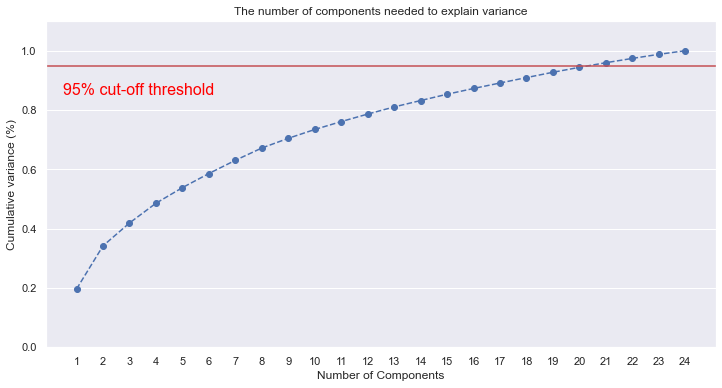

In [34]:
pca = PCA().fit(features_scaled)
print(pca.explained_variance_ratio_)
plt.rcParams['figure.figsize'] = (12, 6)

fig, ax = plt.subplots()
xi = np.arange(1, 25, step=1)
yi = np.cumsum(pca.explained_variance_ratio_)
plt.ylim(0.0, 1.1)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 25, step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color='red', fontsize=16)

ax.grid(axis='x')
plt.show()
#cumsum(): function returns the cumulative sum of the elements along the given axis.
#axhline(): Add a horizontal line across the axis.

In [35]:

from sklearn.decomposition import PCA
# specify required no of components
# take 'n_components=5' based on the analysis of scree plot
pca = PCA(n_components=20, random_state=0)  

# fit_transform() computes the principal components 
# pass the standardized data to fit PCA
PrincipalComponents = pca.fit_transform(features_scaled)



In [36]:
# create a dataframe of principal components
PCA_df = pd.DataFrame(data = PrincipalComponents, columns =list(eig_val_df["Features"])[0:20])

print(PCA_df.shape)
PCA_df.head()


(5455, 20)


,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,hotels_other_lodgings,juice_bars,swimming_pools,gyms,cafes,monuments,gardens,view_points,beauty_spas
0,-1.893665,-1.602765,2.049151,-0.444622,0.940288,-0.394181,-1.289944,1.299963,-0.628099,-0.497017,0.222187,-0.249655,-0.579783,0.450431,-0.806154,0.146941,-0.560974,0.163520,-0.020610,-0.894812
1,-1.965920,-1.635939,1.962753,-0.435927,0.942146,-0.326462,-1.246559,1.275024,-0.572384,-0.487593,0.247118,-0.215682,-0.570989,0.446809,-0.878561,0.093060,-0.524738,0.138031,-0.098951,-0.948677
2,-1.965384,-1.630327,1.961432,-0.439716,0.940786,-0.322275,-1.247727,1.276192,-0.578594,-0.486803,0.250046,-0.217120,-0.573466,0.446802,-0.874025,0.089130,-0.523203,0.136566,-0.101048,-0.943584
3,-1.861067,-1.648000,2.045328,-0.533098,0.904892,-0.398970,-1.040360,1.265876,-0.597229,-0.450127,0.121896,-0.194562,-0.580253,0.418414,-0.710791,0.069649,-0.517848,0.136441,0.064186,-0.824979
4,-1.965384,-1.630327,1.961432,-0.439716,0.940786,-0.322275,-1.247727,1.276192,-0.578594,-0.486803,0.250046,-0.217120,-0.573466,0.446802,-0.874025,0.089130,-0.523203,0.136566,-0.101048,-0.943584


### Hierarchical Clustering

In [37]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import scale as s
from scipy.cluster.hierarchy import dendrogram, linkage

In [38]:
pca_df = pd.concat([data_final[PCA_df.columns], data_final["id"]], axis=1)
pca_df.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,hotels_other_lodgings,juice_bars,swimming_pools,gyms,cafes,monuments,gardens,view_points,beauty_spas,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,1.7,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,1.7,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.7,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,1.7,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.7,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,5


In [39]:
Z = linkage(pca_df, method='ward')
Z

array([[2.99000000e+02, 3.00000000e+02, 1.00005000e+00, 2.00000000e+00],
       [6.11000000e+02, 6.12000000e+02, 1.00005000e+00, 2.00000000e+00],
       [6.59000000e+02, 6.60000000e+02, 1.00005000e+00, 2.00000000e+00],
       ...,
       [1.09010000e+04, 1.09040000e+04, 3.92923634e+04, 2.37500000e+03],
       [1.09030000e+04, 1.09060000e+04, 8.13675983e+04, 3.83000000e+03],
       [1.09050000e+04, 1.09070000e+04, 1.30323431e+05, 5.45500000e+03]])

Text(0.5, 1.0, 'Hierarchical Clustering')

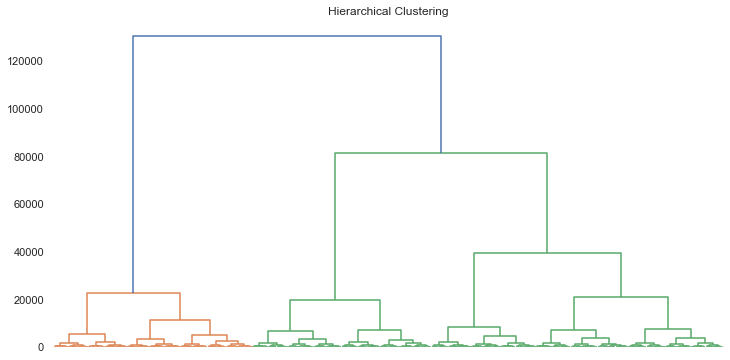

In [40]:
#Creating and plotting dendrogram
den = dendrogram(Z)
plt.tick_params(axis='x',  #which axis to apply the parameters to. Default is 'both'
                which='both',  #Default is 'major'/'x', apply arguments to which ticks
                bottom=False,  #bottom, top, left, right --> bool
                top=False, 
                labelbottom=False)  #labelbottom, labeltop, labelright, labelleft
plt.title('Hierarchical Clustering')

In [41]:
#Creating a function to determine the cutting line
def fd(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

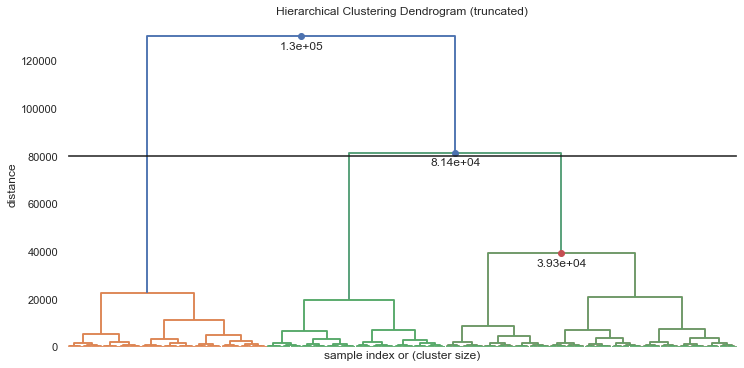

In [42]:
#Creating a dendrogram with cutting line
fd(Z, leaf_rotation=90, show_contracted=True, annotate_above=30000, max_d=80000)

den = sch.dendrogram(Z)
plt.tick_params(axis='x',  
                which='both',  
                bottom=False,  
                top=False, 
                labelbottom=False)  

In [43]:
#Importing packages
from sklearn.cluster import AgglomerativeClustering

#Creating an Agglomerative Clustering
hc_model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')

In [44]:
y_cluster = hc_model.fit_predict(pca_df)

In [45]:
data_clustered = pca_df.copy()
data_clustered["Cluster"] = y_cluster.astype('object')
data_clustered.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,juice_bars,swimming_pools,gyms,cafes,monuments,gardens,view_points,beauty_spas,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,1,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,2,1
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,3,1
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,4,1
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,5,1


In [46]:
cols = list(pca_df.columns)
cols

['churches',
 'resorts',
 'beaches',
 'parks',
 'theatres',
 'museums',
 'malls',
 'zoo',
 'restaurants',
 'pubs_bars',
 'local_services',
 'hotels_other_lodgings',
 'juice_bars',
 'swimming_pools',
 'gyms',
 'cafes',
 'monuments',
 'gardens',
 'view_points',
 'beauty_spas',
 'id']

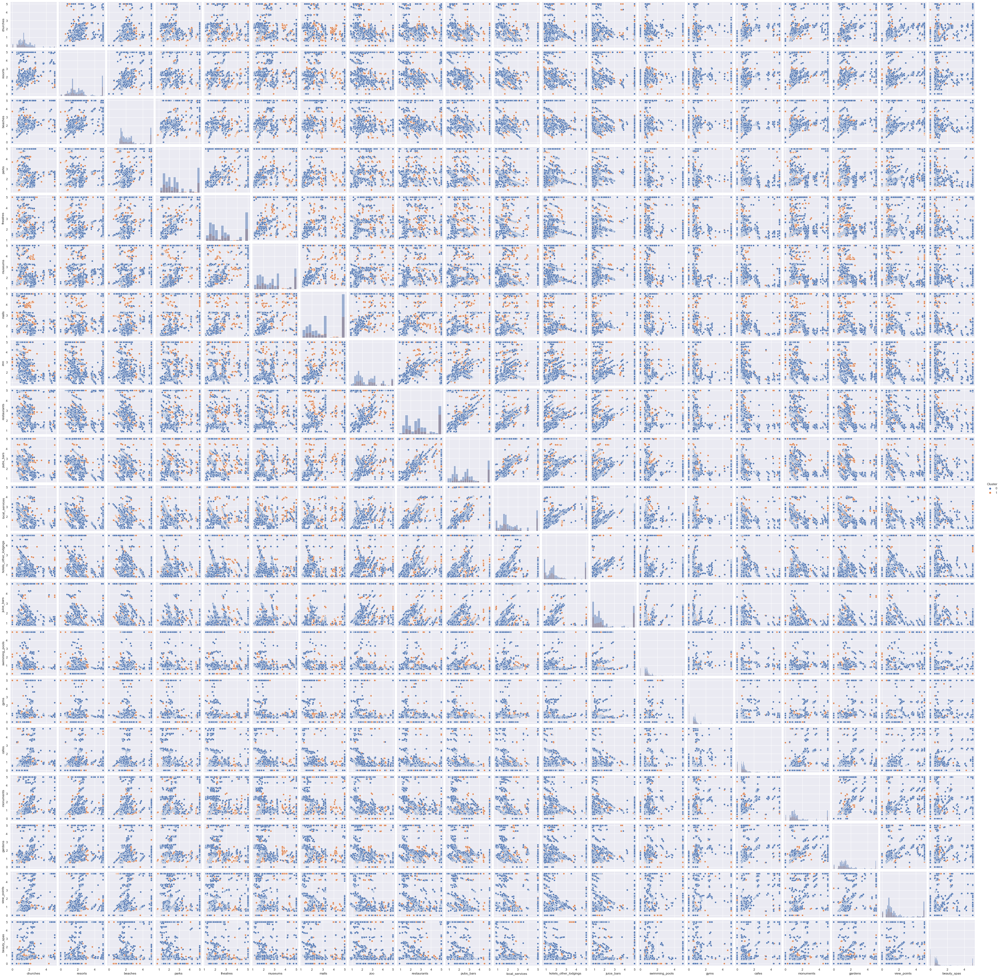

In [47]:
sns.pairplot(data_clustered, hue="Cluster", diag_kind="hist")
plt.show()

In [48]:
result = data_clustered.copy()
result.replace({'Cluster': 1}, 'Positive', inplace=True)
result.replace({'Cluster': 0}, 'Negative', inplace=True)
result.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,juice_bars,swimming_pools,gyms,cafes,monuments,gardens,view_points,beauty_spas,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,1,Positive
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,2,Positive
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,3,Positive
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,4,Positive
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.72,0.5,0.0,0.0,0.0,0.0,0.0,0.0,5,Positive


In [49]:
result.sample(10)

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,juice_bars,swimming_pools,gyms,cafes,monuments,gardens,view_points,beauty_spas,id,Cluster
3253,1.09,1.13,1.80,3.21,5.00,5.00,5.00,1.97,2.60,2.59,...,1.77,0.51,0.00,0.53,1.05,1.06,1.06,0.51,3254,Negative
2980,1.36,1.41,1.91,1.91,5.00,3.20,3.20,3.96,5.00,5.00,...,1.54,0.50,0.00,0.53,1.38,1.36,0.58,0.54,2981,Negative
357,1.09,5.00,2.00,5.00,2.64,2.65,2.24,3.85,5.00,2.83,...,3.86,0.76,0.77,0.73,0.83,0.89,0.85,0.84,358,Positive
2780,4.44,5.00,2.67,2.64,2.63,2.64,2.42,1.28,5.00,1.23,...,1.52,0.78,0.79,0.91,0.88,0.91,0.90,0.98,2781,Negative
2847,1.30,1.30,5.00,4.13,4.77,5.00,2.84,2.66,1.70,1.65,...,0.81,0.60,0.58,0.67,1.18,5.00,5.00,0.58,2848,Negative
3654,4.44,3.69,5.00,2.66,2.64,2.28,2.46,1.33,4.85,1.28,...,1.55,0.77,0.79,0.88,0.85,0.86,0.86,0.93,3655,Negative
2856,1.31,1.30,1.35,4.76,4.94,5.00,5.00,2.84,2.41,1.69,...,0.80,1.06,0.71,0.57,4.75,1.18,0.67,0.55,2857,Negative
4859,2.10,5.00,2.62,2.63,3.26,3.24,3.23,2.81,2.78,2.79,...,0.80,0.00,0.89,0.89,1.18,1.51,0.91,0.91,4860,Negative
2272,1.78,1.15,1.83,3.27,5.00,5.00,5.00,1.96,1.78,2.59,...,1.49,0.00,0.00,0.00,1.06,1.08,1.08,0.50,2273,Negative
4413,1.63,1.65,1.69,2.65,2.04,1.93,2.02,1.99,2.00,2.50,...,2.11,5.00,5.00,0.66,1.63,1.63,1.72,0.00,4414,Negative
